<a href="https://colab.research.google.com/github/PoeQulta/SimpleRNN_ImageCaption/blob/main/7685_PolaQulta_RNN_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Part I: Getting The dataset

In [1]:
!curl -L -o flickr8k.zip https://www.kaggle.com/api/v1/datasets/download/adityajn105/flickr8k

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 1061M  100 1061M    0     0  78.4M      0  0:00:13  0:00:13 --:--:-- 60.0M


In [2]:
!unzip flickr8k.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/Images/2844846111_8c1cbfc75d.jpg  
  inflating: data/Images/2844963839_ff09cdb81f.jpg  
  inflating: data/Images/2845246160_d0d1bbd6f0.jpg  
  inflating: data/Images/2845691057_d4ab89d889.jpg  
  inflating: data/Images/2845845721_d0bc113ff7.jpg  
  inflating: data/Images/2846037553_1a1de50709.jpg  
  inflating: data/Images/2846785268_904c5fcf9f.jpg  
  inflating: data/Images/2846843520_b0e6211478.jpg  
  inflating: data/Images/2847514745_9a35493023.jpg  
  inflating: data/Images/2847615962_c330bded6e.jpg  
  inflating: data/Images/2847859796_4d9cb0d31f.jpg  
  inflating: data/Images/2848266893_9693c66275.jpg  
  inflating: data/Images/2848571082_26454cb981.jpg  
  inflating: data/Images/2848895544_6d06210e9d.jpg  
  inflating: data/Images/2848977044_446a31d86e.jpg  
  inflating: data/Images/2849194983_2968c72832.jpg  
  inflating: data/Images/2850719435_221f15e951.jpg  
  inflating: data/Images/2851198725_37b6027625.j

##Part II: Dataset preprocessing

In [3]:
import re
from collections import Counter

def clean_tokenize_caption(caption):
    # Remove special characters
    caption = re.sub(r"[^A-Za-z0-9\s]", "", caption)
    # Convert to lowercase
    caption = caption.lower()
    # Tokenize
    tokens = caption.split()
    return tokens

def build_vocab(captions, threshold=5):
    counter = Counter()
    for caption in captions:
        tokens = clean_tokenize_caption(caption)
        counter.update(tokens)

    # Create vocabulary and add special tokens
    vocab = {"<unk>": 0, "<pad>": 1, "<start>": 2, "<end>": 3}
    index = 4
    for word, count in counter.items():
        if count >= threshold:
            vocab[word] = index
            index += 1
    return vocab

def caption_to_sequence(caption, vocab):
    tokens = clean_tokenize_caption(caption)
    tokens = ["<start>"] + tokens + ["<end>"]
    sequence = [vocab.get(token, vocab["<unk>"]) for token in tokens]
    return sequence

In [4]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image

class ImageCaptionDataset(Dataset):
    def __init__(self, image_folder, caption_path, transform=None):
        self.image_folder = image_folder

        with open(caption_path) as f:
          lines = f.read().splitlines()[1:]
        self.captions = [tuple(line.split(".jpg,")) for line in lines]
        self.vocab = build_vocab([k[1] for k in self.captions])
        self.transform = transform

    def __len__(self):
        return len(self.captions)

    def __getitem__(self, idx):
        img_name, caption = self.captions[idx]
        img_path = os.path.join(self.image_folder, img_name+".jpg")
        image = Image.open(img_path).convert("RGB")
        if self.transform is not None:
            image = self.transform(image)
        else:
          self.transform = transforms.Compose([transforms.ToTensor()])
          image = self.transform(image)

        caption_sequence = caption_to_sequence(caption, self.vocab)
        return image, torch.tensor(caption_sequence)

In [5]:
image_folder = "/content/data/Images"
caption_file = "/content/data/captions.txt"

# Define image transformations
preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


# Create the dataset
dataset = ImageCaptionDataset(image_folder, caption_file, preprocess)

# DataLoader for batching and iteration
from torch.utils.data import DataLoader, random_split

def collate_fn(batch):
    images, captions = zip(*batch)
    images = torch.stack(images, 0)

    # Padding the captions
    lengths = [len(cap) for cap in captions]
    padded_in_captions = torch.full((len(captions), max(lengths)-1),dataset.vocab["<pad>"]).long()
    padded_out_captions = torch.full((len(captions), max(lengths)-1),dataset.vocab["<pad>"]).long()
    for i, cap in enumerate(captions):
        end = lengths[i]
        padded_in_captions[i, :end-1] = cap[:end-1]
        padded_out_captions[i, :end-1] = cap[1:end]

    return images, padded_in_captions, padded_out_captions

# Define the split proportions
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)


##Part III: Model Definition

In [6]:
import torch
import torchvision.models as models
from torch import nn

In [7]:
class FeatureExtract(nn.Module):
    def __init__(self):
        super(FeatureExtract, self).__init__()
        # Keep everything except the fully connected layers
        self.features = models.inception_v3(weights=models.Inception_V3_Weights.DEFAULT)
        self.features.fc = nn.Identity()
    def forward(self, x):
      x = self.features(x)
      if(self.training):
        x = x.logits
      return x

In [18]:
class CaptionModel(nn.Module):
  def __init__(self, FeatureExtractor,hidden_size,vocab_size,embedding_dim=128,num_layers=3,feature_size=2048) -> None:
      super(CaptionModel, self).__init__()
      self.FeatureExtractor = FeatureExtractor
      self.FeatureEmbedding = nn.Linear(feature_size, hidden_size*num_layers)
      self.embedding = nn.Embedding(vocab_size, embedding_dim)
      self.rnn = nn.RNN(embedding_dim, hidden_size,num_layers, batch_first=True,dropout=0.1)
      self.fc = nn.Linear(hidden_size, vocab_size)
      self.hidden_size = hidden_size
      self.num_layers = num_layers
  def forward(self,img,x):
    fet = self.FeatureExtractor(img)
    h0 = self.FeatureEmbedding(fet)
    h0 = torch.reshape(h0, (self.num_layers, -1, self.hidden_size))
    embedded = self.embedding(x)
    out, hn = self.rnn(embedded, h0)
    out = self.fc(out)
    return out, hn

##Part IV: Training

In [11]:
!pip install pycocoevalcap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 7.7 MB/s eta 0:00:00


In [12]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [17]:
extractor = FeatureExtract().to(device)
for param in extractor.parameters():
    param.requires_grad = False

In [14]:
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
from nltk.translate.bleu_score import corpus_bleu
from pycocoevalcap.cider.cider import Cider
from tqdm.notebook import tqdm
# Function to train the model
def train_epoch(model, train_loader, criterion, optimizer, vocab_size,device):
  model.train()
  total_loss = 0
  for images, inCaptions, outCaptions in tqdm(train_loader):
    optimizer.zero_grad()
    outputs, _ = model(images.to(device),inCaptions.to(device))
    loss = criterion(outputs.view(-1, vocab_size), outCaptions.to(device).view(-1))
    loss.backward()
    optimizer.step()
    total_loss += loss.item()
  avg_loss = total_loss / len(train_loader)
  return avg_loss

In [15]:
from nltk.translate.bleu_score import SmoothingFunction
import numpy as np
# Function to test the model
def evaluate_model(model, data_loader, vocab, reverse_vocab):
    model.eval()
    bleu_scores = []

    references = {}
    hypotheses = {}

    with torch.no_grad():
        for i, (images, inCaptions, outCaptions) in enumerate(tqdm(data_loader)):
            outputs, _ = model(images.to(device),inCaptions.to(device))
            _, predicted = torch.max(outputs, 2)
            predicted = predicted.cpu()
            for j in range(len(inCaptions)):
                reference = [reverse_vocab[idx.item()] for idx in outCaptions[j] if idx.item() not in [0, 1, 2, 3]]
                hypothesis = [reverse_vocab[idx.item()] for idx in predicted[j] if idx.item() not in [0, 1, 2, 3]]
                # Use a unique ID for each image-caption pair
                image_id = f"{i}_{j}"

                references[image_id] = " ".join(reference)
                hypotheses[image_id] = " ".join(hypothesis)

            # Calculate BLEU score
            smoothing_function = SmoothingFunction().method1
            bleu_score = corpus_bleu(
                [[ref.split()] for ref in references.values()],
                [hyp.split() for hyp in hypotheses.values()],
                smoothing_function=smoothing_function
            )
            bleu_scores.append(bleu_score)

    # Calculate CIDEr score
    cider_scorer = Cider()
    gts = {key: [val] for key, val in references.items()}
    res = {key: [val[0]] for key, val in hypotheses.items()}
    cider_score, _ = cider_scorer.compute_score(gts, res)

    avg_bleu_score = np.mean(bleu_scores)
    avg_cider_score = cider_score

    print(f"BLEU Score: {avg_bleu_score:.4f}")
    print(f"CIDEr Score: {avg_cider_score:.4f}")

    return avg_bleu_score, avg_cider_score

In [16]:
val_bleus = list()
val_ciders = list()

In [19]:
import torch.optim as optim
hidden_size = 512
learning_rate = 0.01
num_epochs = 50
model = CaptionModel(extractor,hidden_size,len(dataset.vocab)).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
reverse_vocab = {v: k for k, v in dataset.vocab.items()}
save_path = "/content/drive/MyDrive/Deep_chkp"
for epoch in range(num_epochs):
  avg_loss = train_epoch(model,train_loader,criterion,optimizer,len(dataset.vocab),device)
  print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")
  val_bleu, val_cider = evaluate_model(model, val_loader, dataset.vocab, reverse_vocab)
  val_bleus.append(val_bleu)
  val_ciders.append(val_cider)
  if(epoch % 5 ==0 and epoch!=0):
    torch.save(model.state_dict(), os.path.join(save_path,f"epoch_{epoch}.pt"))

  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [1/50], Loss: 3.8071


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0040
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [2/50], Loss: 3.5326


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0033
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [3/50], Loss: 3.6832


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0012
CIDEr Score: 0.0119


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [4/50], Loss: 3.7456


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0031
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [5/50], Loss: 3.7288


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0036
CIDEr Score: 0.0125


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [6/50], Loss: 3.7401


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0013
CIDEr Score: 0.0132


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [7/50], Loss: 3.7779


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0016
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [8/50], Loss: 3.7465


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0007
CIDEr Score: 0.0129


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [9/50], Loss: 3.7232


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0021
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [10/50], Loss: 3.7643


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0162
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [11/50], Loss: 3.7977


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0064
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [12/50], Loss: 3.7376


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0181
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [13/50], Loss: 3.7450


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0030
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [14/50], Loss: 3.7414


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0022
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [15/50], Loss: 3.7488


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0092
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [16/50], Loss: 3.7468


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0038
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [17/50], Loss: 3.7566


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0041
CIDEr Score: 0.0057


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [18/50], Loss: 3.7365


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0053
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [19/50], Loss: 3.7489


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0075
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [20/50], Loss: 3.7376


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0059
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

Epoch [21/50], Loss: 3.7609


  0%|          | 0/127 [00:00<?, ?it/s]

BLEU Score: 0.0061
CIDEr Score: 0.0186


  0%|          | 0/1012 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
# Example usage

test_bleu, test_cider = evaluate_model(model, test_loader, dataset.vocab, reverse_vocab)


In [ ]:
references = {}
hypotheses = {}
images = {}
with torch.no_grad():
  test_data = iter(test_loader)
  for i in tqdm(range(2)):
    images, inCaptions, outCaptions  = next(test_data)
    outputs, _ = model(images.to(device),inCaptions.to(device))
    _, predicted = torch.max(outputs, 2)
    predicted = predicted.cpu()
    for j in range(len(inCaptions)):
        reference = [reverse_vocab[idx.item()] for idx in outCaptions[j] if idx.item() not in [0, 1, 2, 3]]
        hypothesis = [reverse_vocab[idx.item()] for idx in predicted[j] if idx.item() not in [0, 1, 2, 3]]
        # Use a unique ID for each image-caption pair
        image_id = f"{i}_{j}"
        references[image_id] = " ".join(reference)
        hypotheses[image_id] = " ".join(hypothesis)
        images[image_id] = images[j]

  0%|          | 0/127 [00:00<?, ?it/s]

{'0_0': 'a dog dog a leash toy golf standing in large pacifier horse', '0_1': 'a dogs row in in standing a a pacifier row towards', '0_2': 'a man in groom pacifier game other a in a leaves', '0_3': 'a man sitting orange purple of stands in a side next flowers pacifier sitting', '0_4': 'a man lane outside a pacifier game in dark pacifier of a holding pacifier dog', '0_5': 'a man dog white dog runs swimming in a woods', '0_6': 'a man in a pacifier building row in', '0_7': 'a man in a pacifier jacket poses sitting onto down a', '0_8': 'a man in a pacifier his in a snow', '0_9': 'a man is sitting patterned snow to a row collar and', '0_10': 'a man dog is to a playing an pacifier', '0_11': 'a man in in a pants with a building', '0_12': 'a young in in a pacifier photo each cowboy flowers water patterned sitting', '0_13': 'a young shepherd water in each other in', '0_14': 'a man dog in onto an pacifier hat', '0_15': 'two young walk in in', '0_16': 'a man in a pacifier ball stands flying in', 

KeyboardInterrupt: 

In [23]:
references = {}
hypotheses = {}
image_dict = {}
with torch.no_grad():
  test_data = iter(test_loader)
  for i in tqdm(range(1)):
    images, inCaptions, outCaptions  = next(test_data)
    outputs, _ = model(images.to(device),inCaptions.to(device))
    _, predicted = torch.max(outputs, 2)
    predicted = predicted.cpu()
    for j in range(len(inCaptions)):
        reference = [reverse_vocab[idx.item()] for idx in outCaptions[j] if idx.item() not in [0, 1, 2, 3]]
        hypothesis = [reverse_vocab[idx.item()] for idx in predicted[j] if idx.item() not in [0, 1, 2, 3]]
        # Use a unique ID for each image-caption pair
        image_id = f"{i}_{j}"
        references[image_id] = " ".join(reference)
        hypotheses[image_id] = " ".join(hypothesis)
        image_dict[image_id] = images[j]

  0%|          | 0/1 [00:00<?, ?it/s]

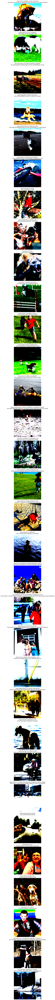

In [24]:
import matplotlib.pyplot as plt
from PIL import Image

# Number of images
num_images = len(image_dict)

# Create a figure with subplots
fig, axes = plt.subplots(num_images, 1, figsize=(10, 5 * num_images))

if num_images == 1:
    axes = [axes]

# Loop through the dictionaries and display images with captions
for ax, img_key in zip(axes, image_dict.keys()):
    image = image_dict[img_key].permute(1, 2, 0)
    caption1 = hypotheses[img_key]
    caption2 = references[img_key]

    # Display image
    ax.imshow(image)
    ax.axis("off")

    # Add captions below the image
    ax.set_title(f"hyp:{caption1}\nref:{caption2}", fontsize=12, loc='center')

# Adjust layout
plt.tight_layout()
plt.show()
